In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
%cd /content/drive/MyDrive/proyectoml

/content/drive/MyDrive/proyectoml


In [ ]:
!ls

combined_dataset  dataset  yolo11n.pt  yolo11s.pt  yolo11x.pt


In [ ]:
import os
import shutil  # Para copiar archivos
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split

# Configuración
IMAGES_PATH = '/content/drive/MyDrive/proyectoml/combined_dataset/images'  # Ruta de imágenes sin etiquetar
LABELS_PATH = '/content/drive/MyDrive/proyectoml/combined_dataset/labels'  # Ruta de etiquetas
OUTPUT_PATH = '/content/drive/MyDrive/proyectoml/dataset'  # Ruta para el dataset dividido

# Crear carpetas necesarias
for split in ["train", "val", "test"]:
    os.makedirs(f"{OUTPUT_PATH}/{split}/images", exist_ok=True)
    os.makedirs(f"{OUTPUT_PATH}/{split}/labels", exist_ok=True)

# Procesar imágenes
all_data = []
for image_file in os.listdir(IMAGES_PATH):
    if image_file.lower().endswith(('.jpg', '.png', '.jpeg')):
        image_path = os.path.join(IMAGES_PATH, image_file)
        image_name = os.path.splitext(image_file)[0]
        label_path = os.path.join(LABELS_PATH, f"{image_name}.txt")

        # Verificar que la imagen tiene una etiqueta asociada
        if os.path.exists(label_path):
            all_data.append((image_path, label_path))

# Dividir en train (80%), val (10%) y test (10%)
train, temp = train_test_split(all_data, test_size=0.2, random_state=42)
val, test = train_test_split(temp, test_size=0.5, random_state=42)

# Función para copiar archivos a las carpetas correspondientes
def copy_files(dataset, split):
    for image_path, label_path in dataset:
        print(f"Copiando {image_path} to {OUTPUT_PATH}/{split}/images/")
        shutil.copy(image_path, f"{OUTPUT_PATH}/{split}/images/")
        print(f"Copiando {label_path} to {OUTPUT_PATH}/{split}/labels/")
        shutil.copy(label_path, f"{OUTPUT_PATH}/{split}/labels/")

# Copiar archivos a cada carpeta
copy_files(train, "train")
copy_files(val, "val")
copy_files(test, "test")

print(f"Tamaño del conjunto de entrenamiento: {len(train)}")
print(f"Tamaño del conjunto de validación: {len(val)}")
print(f"Tamaño del conjunto de prueba: {len(test)}")

print("✅ Dataset creado y dividido correctamente. Archivos copiados a sus respectivas carpetas.")

Se han truncado las últimas 5000 líneas del flujo de salida.
Copiando /content/drive/MyDrive/proyectoml/combined_dataset/images/2_06_06-35-_jpg.rf.246810397fd858a3f7673c7082ddcf83.jpg to /content/drive/MyDrive/proyectoml/dataset/train/images/
Copiando /content/drive/MyDrive/proyectoml/combined_dataset/labels/2_06_06-35-_jpg.rf.246810397fd858a3f7673c7082ddcf83.txt to /content/drive/MyDrive/proyectoml/dataset/train/labels/
Copiando /content/drive/MyDrive/proyectoml/combined_dataset/images/7_2_jpg.rf.c5b0f699058687a70550cfa131cf87b3.jpg to /content/drive/MyDrive/proyectoml/dataset/train/images/
Copiando /content/drive/MyDrive/proyectoml/combined_dataset/labels/7_2_jpg.rf.c5b0f699058687a70550cfa131cf87b3.txt to /content/drive/MyDrive/proyectoml/dataset/train/labels/
Copiando /content/drive/MyDrive/proyectoml/combined_dataset/images/16_2_jpg.rf.36d48ce2c10b4bdf40c742d80bdd7486.jpg to /content/drive/MyDrive/proyectoml/dataset/train/images/
Copiando /content/drive/MyDrive/proyectoml/combined_

In [ ]:
!ls dataset/train/images | head -n 5  # Muestra las primeras 5 imágenes
!ls dataset/train/labels | head -n 5  # Muestra las primeras 5 etiquetas

10_1_jpg.rf.16f929b1c4a32d6aa9847818cc9422c9.jpg
10_1_jpg.rf.25751b2b1c4afe18a058f3b05380897b.jpg
10_1_jpg.rf.5eeca935e9a9d0313434363c444d546f.jpg
10_1_jpg.rf.6018ab6d660cd1e90d4c925950adaed3.jpg
10_1_jpg.rf.ac92fbec342a91de8437f55ee5e01aa7.jpg
10_1_jpg.rf.16f929b1c4a32d6aa9847818cc9422c9.txt
10_1_jpg.rf.25751b2b1c4afe18a058f3b05380897b.txt
10_1_jpg.rf.5eeca935e9a9d0313434363c444d546f.txt
10_1_jpg.rf.6018ab6d660cd1e90d4c925950adaed3.txt
10_1_jpg.rf.ac92fbec342a91de8437f55ee5e01aa7.txt


In [ ]:
!pip uninstall ultralytics "ray[tune]"

Found existing installation: ultralytics 8.3.67
Uninstalling ultralytics-8.3.67:
  Would remove:
    /usr/local/bin/ultralytics
    /usr/local/bin/yolo
    /usr/local/lib/python3.11/dist-packages/tests/*
    /usr/local/lib/python3.11/dist-packages/ultralytics-8.3.67.dist-info/*
    /usr/local/lib/python3.11/dist-packages/ultralytics/*
Proceed (Y/n)? Y
  Successfully uninstalled ultralytics-8.3.67
Found existing installation: ray 2.41.0
Uninstalling ray-2.41.0:
  Would remove:
    /usr/local/bin/ray
    /usr/local/bin/rllib
    /usr/local/bin/serve
    /usr/local/bin/tune
    /usr/local/lib/python3.11/dist-packages/ray-2.41.0.dist-info/*
    /usr/local/lib/python3.11/dist-packages/ray/*
Proceed (Y/n)? Y
  Successfully uninstalled ray-2.41.0


In [ ]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 914.9/914.9 kB 37.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 3.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 114.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 87.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 55.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 4.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 40.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 18.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 4.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 76.0 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninsta

In [ ]:
# Install and update Ultralytics and Ray Tune packages
!pip install -U ultralytics "ray[tune]"

# Optionally install W&B for logging
!pip install wandb
!pip install albumentations ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 914.9/914.9 kB 38.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 101.7/101.7 kB 11.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.2/67.2 MB 32.7 MB/s eta 0:00:00


In [ ]:
from ultralytics import YOLO

# Inicializa el modelo YOLO preentrenado
model = YOLO("yolo11x.pt")  

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


In [ ]:
import os
WANDB_ENV_VAR = "WANDB_API_KEY"
os.environ[WANDB_ENV_VAR] = "6e05a458301829ac220faf91d589af333da9aea0"

## Ajuste de hiperparámetros

In [ ]:
# Ejecuta el ajuste de hiperparámetros
model.tune(
    data='/content/drive/MyDrive/proyectoml/dataset/data.yaml',           # Ruta al archivo de configuración del dataset
    epochs=10,                  # Número de épocas para cada prueba
    optimizer="AdamW",
    plots=True,                 # Generar gráficos de resultados
    save=True,                  # Guardar resultados y mejores modelos
    name='tune',  # Nombre del experimento
    exist_ok=True,
    gpu_per_trial = 1,
    batch=-1,
    use_ray=True
)


💡 Learn about RayTune at https://docs.ultralytics.com/integrations/ray-tune
WARNING ⚠️ search space not provided, using default search space.
+--------------------------------------------------------------+
| Configuration for experiment     _tune_2025-01-30_22-52-55   |
+--------------------------------------------------------------+
| Search algorithm                 BasicVariantGenerator       |
| Scheduler                        AsyncHyperBandScheduler     |
| Number of trials                 10                          |
+--------------------------------------------------------------+

View detailed results here: /content/drive/MyDrive/proyectoml/runs/detect/tune/_tune_2025-01-30_22-52-55
To visualize your results with TensorBoard, run: `tensorboard --logdir /tmp/ray/session_2025-01-30_22-49-52_948689_4162/artifacts/2025-01-30_22-52-55/_tune_2025-01-30_22-52-55/driver_artifacts`

Trial status: 10 PENDING
Current time: 2025-01-30 22:52:55. Total running time: 0s
Logical resource us

2025-01-30 23:13:57,034	WARNING tune.py:219 -- Stop signal received (e.g. via SIGINT/Ctrl+C), ending Ray Tune run. This will try to checkpoint the experiment state one last time. Press CTRL+C (or send SIGINT/SIGKILL/SIGTERM) to skip. 
2025-01-30 23:13:57,056	INFO tune.py:1009 -- Wrote the latest version of all result files and experiment state to '/content/drive/MyDrive/proyectoml/runs/detect/tune/_tune_2025-01-30_22-52-55' in 0.0200s.
2025-01-30 23:13:57,075	WARNING tune.py:1056 -- Experiment has been interrupted, but the most recent state was saved.
Resume experiment with: Tuner.restore(path="/content/drive/MyDrive/proyectoml/runs/detect/tune/_tune_2025-01-30_22-52-55", trainable=...)
2025-01-30 23:13:57,093	WARNING experiment_analysis.py:180 -- Failed to fetch metrics for 10 trial(s):
- _tune_f1659_00000: FileNotFoundError('Could not fetch metrics for _tune_f1659_00000: both result.json and progress.csv were not found at /content/drive/MyDrive/proyectoml/runs/detect/tune/_tune_2025-

Trial status: 10 PENDING
Current time: 2025-01-30 23:13:57. Total running time: 21min 1s
Logical resource usage: 0/8 CPUs, 0/1 GPUs (0.0/1.0 accelerator_type:T4)
+-------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| Trial name          status           lr0         lrf     momentum     weight_decay     warmup_epochs     warmup_momentum         box        cls        hsv_h       hsv_s       hsv_v     degrees     translate       scale      shear     perspective     flipud     fliplr        bgr      mosaic       mixup     copy_paste |
+-------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

ResultGrid<[
  Result(
    metrics={},
    path='/content/drive/MyDrive/proyectoml/runs/detect/tune/_tune_2025-01-30_22-52-55/_tune_f1659_00000_0_bgr=0.5577,box=0.0992,cls=1.8176,copy_paste=0.9615,degrees=7.8179,fliplr=0.1058,flipud=0.5195,hsv_h=0.0082,hsv_2025-01-30_22-52-55',
    filesystem='local',
    checkpoint=None
  ),
  Result(
    metrics={},
    path='/content/drive/MyDrive/proyectoml/runs/detect/tune/_tune_2025-01-30_22-52-55/_tune_f1659_00001_1_bgr=0.7179,box=0.0440,cls=1.0014,copy_paste=0.1712,degrees=42.7744,fliplr=0.3151,flipud=0.9401,hsv_h=0.0372,hs_2025-01-30_22-52-55',
    filesystem='local',
    checkpoint=None
  ),
  Result(
    metrics={},
    path='/content/drive/MyDrive/proyectoml/runs/detect/tune/_tune_2025-01-30_22-52-55/_tune_f1659_00002_2_bgr=0.5554,box=0.0841,cls=2.7280,copy_paste=0.7372,degrees=22.3982,fliplr=0.4703,flipud=0.5972,hsv_h=0.0816,hs_2025-01-30_22-52-55',
    filesystem='local',
    checkpoint=None
  ),
  Result(
    metrics={},
    path='/conte

In [ ]:
# Ejecuta el ajuste de hiperparámetros
model.tune(
    data='/content/drive/MyDrive/proyectoml/dataset/data.yaml',           # Ruta al archivo de configuración del dataset
    epochs=10,                  # Número de épocas para cada prueba
    optimizer="AdamW",
    plots=True,                 # Generar gráficos de resultados
    save=True,                  # Guardar resultados y mejores modelos
    name='tune_faster',  # Nombre del experimento
    exist_ok=True,
    #gpu_per_trial = 1,
    batch=-1,
    use_ray=False
)

Tuner: Initialized Tuner instance with 'tune_dir=runs/detect/tune_faster'
Tuner: 💡 Learn about tuning at https://docs.ultralytics.com/guides/hyperparameter-tuning
Tuner: Starting iteration 1/10 with hyperparameters: {'lr0': 0.01, 'lrf': 0.01, 'momentum': 0.937, 'weight_decay': 0.0005, 'warmup_epochs': 3.0, 'warmup_momentum': 0.8, 'box': 7.5, 'cls': 0.5, 'dfl': 1.5, 'hsv_h': 0.015, 'hsv_s': 0.7, 'hsv_v': 0.4, 'degrees': 0.0, 'translate': 0.1, 'scale': 0.5, 'shear': 0.0, 'perspective': 0.0, 'flipud': 0.0, 'fliplr': 0.5, 'bgr': 0.0, 'mosaic': 1.0, 'mixup': 0.0, 'copy_paste': 0.0}
WARNING ❌️ training failure for hyperparameter tuning iteration 1
Command 'yolo train task=detect mode=train model=yolo11x.pt data=/content/drive/MyDrive/proyectoml/dataset/data.yaml epochs=10 time=None patience=100 batch=-1 imgsz=640 save=True save_period=-1 cache=False device=None workers=8 project=None name=None exist_ok=True pretrained=True optimizer=AdamW verbose=True seed=0 deterministic=True single_cls=Fal

In [ ]:
!cat runs/detect/tune_faster/best_hyperparameters.yaml

# 10/10 iterations complete ✅ (2914.52s)
# Results saved to runs/detect/tune_faster
# Best fitness=0.0 observed at iteration 1
# Best fitness metrics are {}
# Best fitness model is runs/detect/train
# Best fitness hyperparameters are printed below.

lr0: 0.01
lrf: 0.01
momentum: 0.937
weight_decay: 0.0005
warmup_epochs: 3.0
warmup_momentum: 0.8
box: 7.5
cls: 0.5
dfl: 1.5
hsv_h: 0.015
hsv_s: 0.7
hsv_v: 0.4
degrees: 0.0
translate: 0.1
scale: 0.5
shear: 0.0
perspective: 0.0
flipud: 0.0
fliplr: 0.5
bgr: 0.0
mosaic: 1.0
mixup: 0.0
copy_paste: 0.0


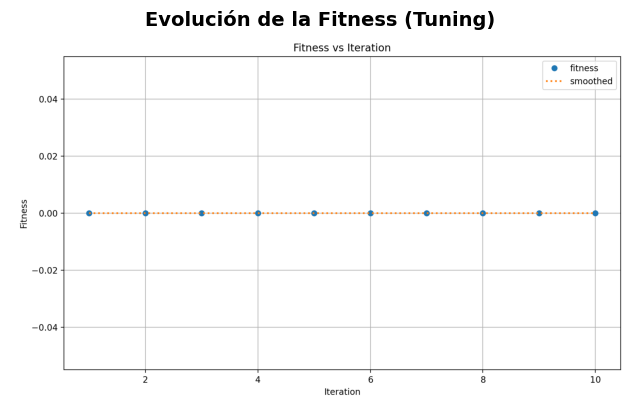

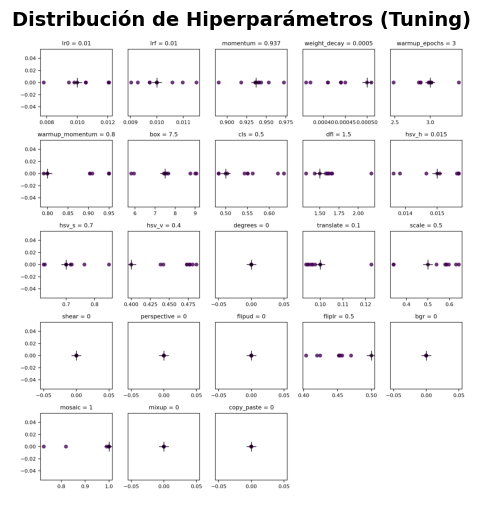

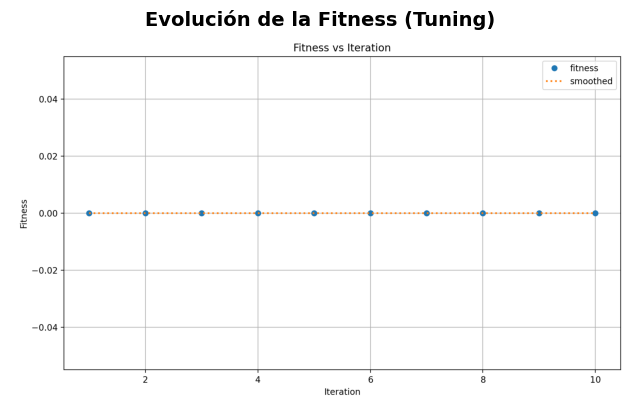

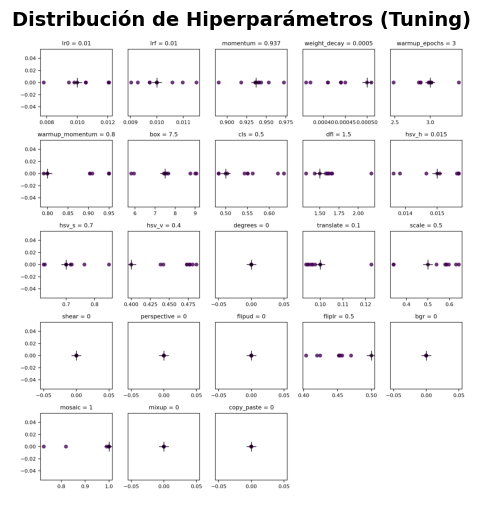

In [8]:
import matplotlib.pyplot as plt
import cv2
import os

# Lista de imágenes con títulos explicativos
image_info = [
    ("/content/drive/MyDrive/proyectoml/runs/detect/tune_faster/tune_fitness.png", "Evolución de la Fitness (Tuning)"),
    ("/content/drive/MyDrive/proyectoml/runs/detect/tune_faster/tune_scatter_plots.png", "Distribución de Hiperparámetros (Tuning)")
]

# Mostrar imágenes con títulos
for img_path, title in image_info:
    if os.path.exists(img_path):  # Verificar si la imagen existe
        img = cv2.imread(img_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Convertir de BGR a RGB para matplotlib

        plt.figure(figsize=(8, 6))  # Tamaño de la figura
        plt.imshow(img)
        plt.axis("off")  # Ocultar ejes
        plt.title(title, fontsize=14, fontweight='bold')  # Agregar título descriptivo
        plt.show()
    else:
        print(f"⚠️ No se encontró la imagen: {img_path}")



## Entrenar el modelo con los mejores hiperparámetros

In [ ]:
# Entrenar el modelo con los mejores hiperparámetros
model.train(
    data="/content/drive/MyDrive/proyectoml/dataset/data.yaml",
    epochs=10,                          # Más épocas para el modelo final
    imgsz=640,                           # Tamaño de las imágenes
    batch=-1,                            # Tamaño del batch
    cfg="runs/detect/tune_faster/best_hyperparameters.yaml",
    optimizer="AdamW",          # Usar optimizador AdamW (puedes probar otros)
    exist_ok=True,
    val = True,
    plots= True,
    save = True,
    name="final_model_tuned",
    device=0
)


Ultralytics 8.3.70 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: task=detect, mode=train, model=yolo11x.pt, data=/content/drive/MyDrive/proyectoml/dataset/data.yaml, epochs=10, time=None, patience=100, batch=-1, imgsz=640, save=True, save_period=-1, cache=False, device=0, workers=8, project=None, name=final_model_tuned, exist_ok=True, pretrained=True, optimizer=AdamW, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_label

100%|██████████| 755k/755k [00:00<00:00, 31.4MB/s]


Overriding model.yaml nc=80 with nc=5

                   from  n    params  module                                       arguments                     
  0                  -1  1      2784  ultralytics.nn.modules.conv.Conv             [3, 96, 3, 2]                 
  1                  -1  1    166272  ultralytics.nn.modules.conv.Conv             [96, 192, 3, 2]               
  2                  -1  2    389760  ultralytics.nn.modules.block.C3k2            [192, 384, 2, True, 0.25]     
  3                  -1  1   1327872  ultralytics.nn.modules.conv.Conv             [384, 384, 3, 2]              
  4                  -1  2   1553664  ultralytics.nn.modules.block.C3k2            [384, 768, 2, True, 0.25]     
  5                  -1  1   5309952  ultralytics.nn.modules.conv.Conv             [768, 768, 3, 2]              
  6                  -1  2   5022720  ultralytics.nn.modules.block.C3k2            [768, 768, 2, True]           
  7                  -1  1   5309952  ultralytics

train: Scanning /content/drive/MyDrive/proyectoml/dataset/train/labels.cache... 2458 images, 101 backgrounds, 0 corrupt: 100%|██████████| 2458/2458 [00:00<?, ?it/s]


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))
AutoBatch: Computing optimal batch size for imgsz=640 at 60.0% CUDA memory utilization.
AutoBatch: CUDA:0 (Tesla T4) 14.74G total, 0.48G reserved, 0.47G allocated, 13.79G free


/usr/local/lib/python3.11/dist-packages/albumentations/__init__.py:24: UserWarning: A new version of Albumentations is available: 2.0.2 (you have 1.4.20). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()


      Params      GFLOPs  GPU_mem (GB)  forward (ms) backward (ms)                   input                  output
    56879551       195.5         3.475          88.2         244.1        (1, 3, 640, 640)                    list
    56879551       390.9         4.758          77.4         163.8        (2, 3, 640, 640)                    list
    56879551       781.9         7.065            96         193.2        (4, 3, 640, 640)                    list
    56879551        1564        11.394         194.5         326.2        (8, 3, 640, 640)                    list
CUDA out of memory. Tried to allocate 14.00 MiB. GPU 0 has a total capacity of 14.74 GiB of which 8.12 MiB is free. Process 78824 has 14.73 GiB memory in use. Of the allocated memory 14.36 GiB is allocated by PyTorch, and 186.13 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for 

train: Scanning /content/drive/MyDrive/proyectoml/dataset/train/labels.cache... 2458 images, 101 backgrounds, 0 corrupt: 100%|██████████| 2458/2458 [00:00<?, ?it/s]

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))



val: Scanning /content/drive/MyDrive/proyectoml/dataset/val/labels.cache... 307 images, 21 backgrounds, 0 corrupt: 100%|██████████| 307/307 [00:00<?, ?it/s]


Plotting labels to runs/detect/final_model_tuned/labels.jpg... 
optimizer: AdamW(lr=0.01, momentum=0.937) with parameter groups 167 weight(decay=0.0), 174 weight(decay=0.0005078125), 173 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to runs/detect/final_model_tuned
Starting training for 10 epochs...
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/10      6.69G      1.821      2.764      1.179          8        640: 100%|██████████| 492/492 [03:25<00:00,  2.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 31/31 [00:09<00:00,  3.44it/s]

                   all        307       1359      0.722      0.142      0.116     0.0649



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/10      6.04G        1.7      2.353       1.13          9        640: 100%|██████████| 492/492 [03:16<00:00,  2.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 31/31 [00:08<00:00,  3.79it/s]

                   all        307       1359      0.152      0.176      0.123     0.0706



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/10      6.22G      1.607      2.166      1.099         24        640: 100%|██████████| 492/492 [03:14<00:00,  2.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 31/31 [00:08<00:00,  3.76it/s]

                   all        307       1359      0.197      0.361      0.206      0.127



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/10      6.18G      1.503      2.046      1.052          6        640: 100%|██████████| 492/492 [03:14<00:00,  2.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 31/31 [00:08<00:00,  3.76it/s]

                   all        307       1359      0.254      0.385       0.24      0.154



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/10      6.17G      1.461      1.921      1.035         28        640: 100%|██████████| 492/492 [03:13<00:00,  2.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 31/31 [00:08<00:00,  3.75it/s]

                   all        307       1359      0.311      0.339      0.281      0.169



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/10      6.27G      1.433      1.788       1.03          6        640: 100%|██████████| 492/492 [03:13<00:00,  2.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 31/31 [00:08<00:00,  3.79it/s]

                   all        307       1359      0.403      0.436      0.363      0.235



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/10       6.2G      1.387      1.729      1.001         10        640: 100%|██████████| 492/492 [03:13<00:00,  2.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 31/31 [00:08<00:00,  3.76it/s]

                   all        307       1359      0.372      0.553      0.425      0.278



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/10      6.19G      1.334      1.623     0.9917          4        640: 100%|██████████| 492/492 [03:14<00:00,  2.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 31/31 [00:08<00:00,  3.77it/s]

                   all        307       1359       0.44      0.516      0.446       0.29



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/10      6.19G       1.32      1.537     0.9844          4        640: 100%|██████████| 492/492 [03:13<00:00,  2.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 31/31 [00:08<00:00,  3.75it/s]

                   all        307       1359      0.473      0.534      0.483      0.331



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/10      6.19G      1.272      1.461     0.9741         16        640: 100%|██████████| 492/492 [03:13<00:00,  2.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 31/31 [00:08<00:00,  3.76it/s]

                   all        307       1359      0.468      0.568       0.51      0.351



10 epochs completed in 0.578 hours.
Optimizer stripped from runs/detect/final_model_tuned/weights/last.pt, 114.4MB
Optimizer stripped from runs/detect/final_model_tuned/weights/best.pt, 114.4MB

Validating runs/detect/final_model_tuned/weights/best.pt...
Ultralytics 8.3.70 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLO11x summary (fused): 464 layers, 56,832,799 parameters, 0 gradients, 194.4 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 31/31 [00:08<00:00,  3.78it/s]


                   all        307       1359      0.468      0.569       0.51      0.351
            Chaetomium        110        291      0.293      0.294      0.219      0.127
          Cladosporium         74        407      0.549       0.43      0.435      0.226
              Coprinus        164        527      0.555      0.839      0.725      0.543
            Curvularia         37         48      0.455      0.854      0.718      0.514
             Ganoderma         67         86      0.486       0.43      0.454      0.345
Speed: 0.2ms preprocess, 21.9ms inference, 0.0ms loss, 1.1ms postprocess per image
Results saved to runs/detect/final_model_tuned


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1, 2, 3, 4])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7fc704383290>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
        

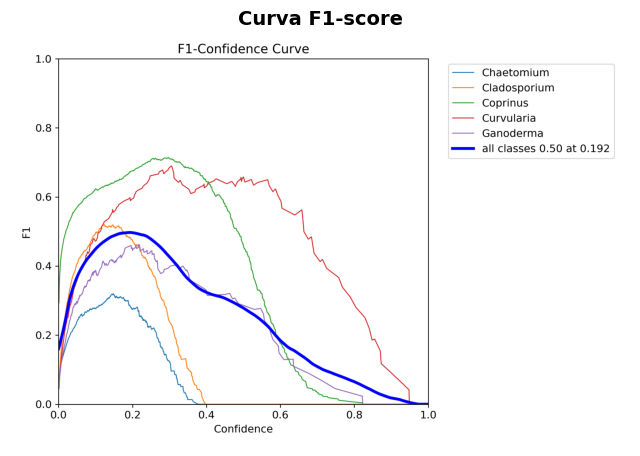

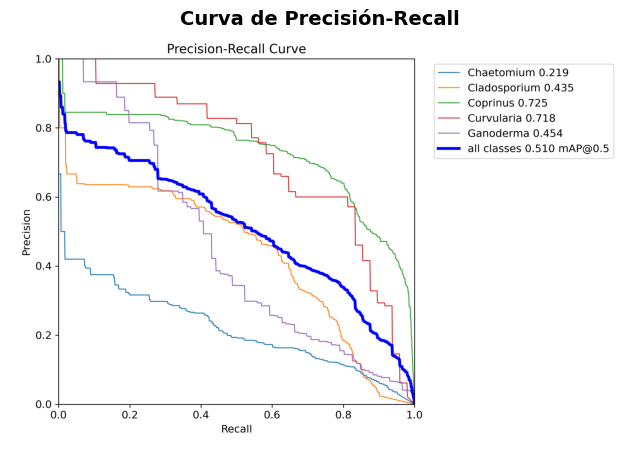

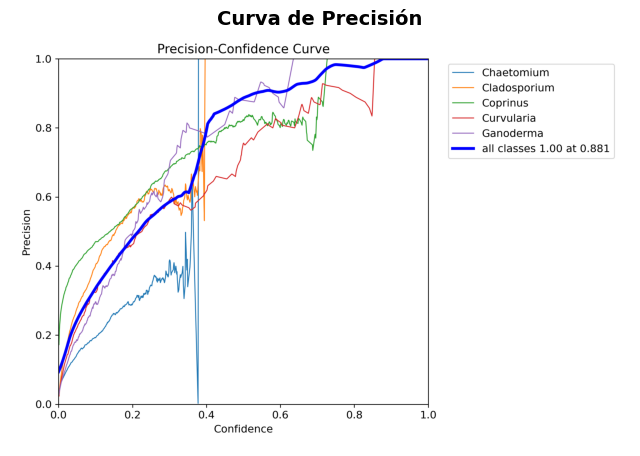

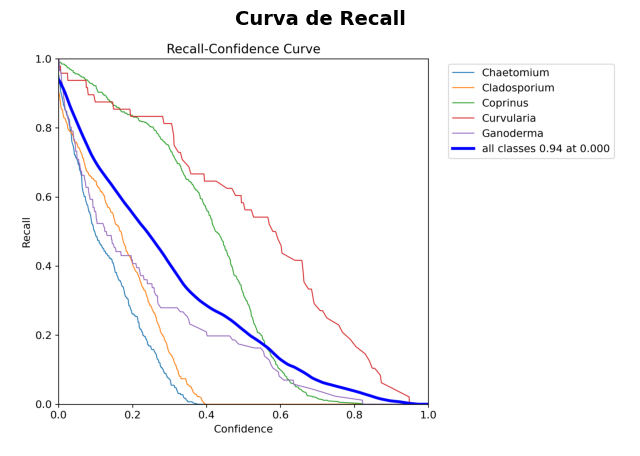

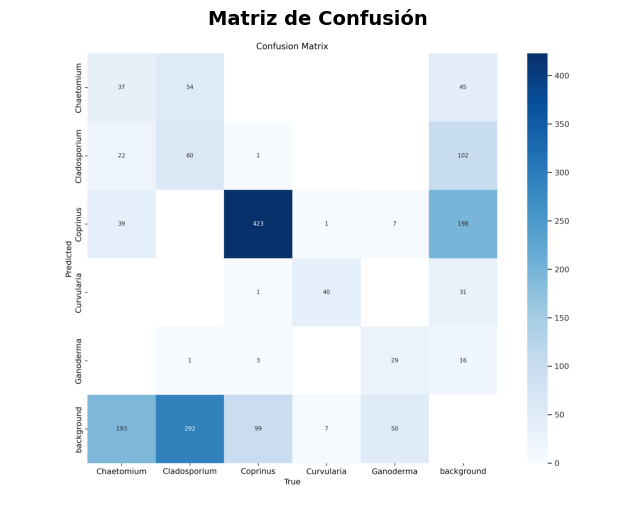

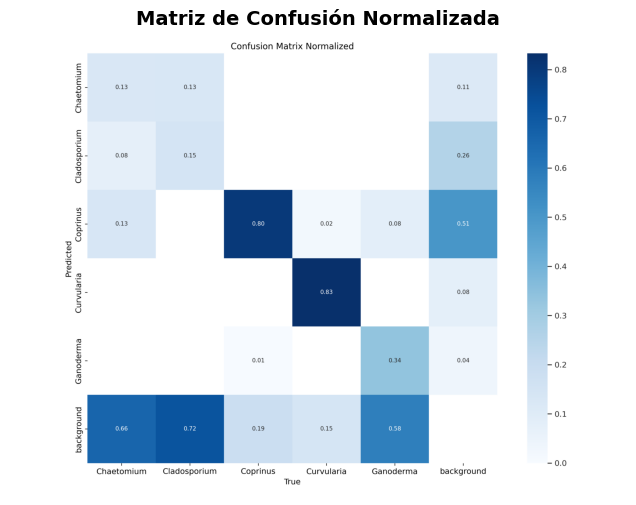

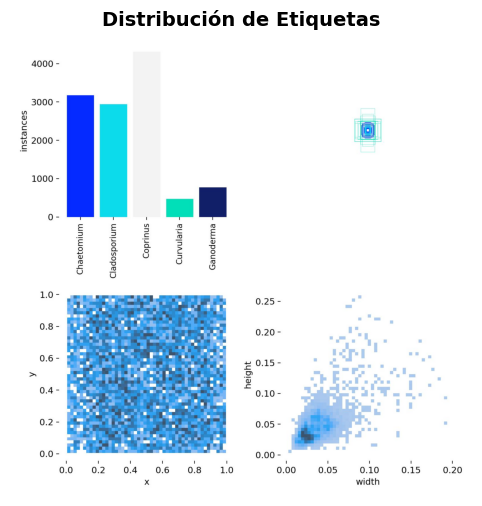

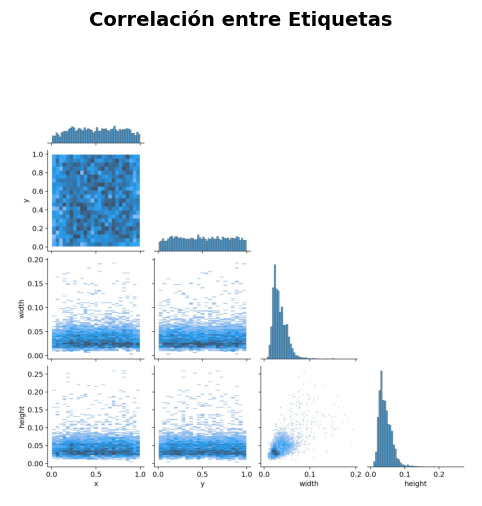

In [5]:
import matplotlib.pyplot as plt
import cv2
import os

# Lista de rutas de imágenes con títulos explicativos
image_info = [
    ("/content/drive/MyDrive/proyectoml/runs/detect/final_model_tuned/F1_curve.png", "Curva F1-score"),
    ("/content/drive/MyDrive/proyectoml/runs/detect/final_model_tuned/PR_curve.png", "Curva de Precisión-Recall"),
    ("/content/drive/MyDrive/proyectoml/runs/detect/final_model_tuned/P_curve.png", "Curva de Precisión"),
    ("/content/drive/MyDrive/proyectoml/runs/detect/final_model_tuned/R_curve.png", "Curva de Recall"),
    ("/content/drive/MyDrive/proyectoml/runs/detect/final_model_tuned/confusion_matrix.png", "Matriz de Confusión"),
    ("/content/drive/MyDrive/proyectoml/runs/detect/final_model_tuned/confusion_matrix_normalized.png", "Matriz de Confusión Normalizada"),
    ("/content/drive/MyDrive/proyectoml/runs/detect/final_model_tuned/labels.jpg", "Distribución de Etiquetas"),
    ("/content/drive/MyDrive/proyectoml/runs/detect/final_model_tuned/labels_correlogram.jpg", "Correlación entre Etiquetas")
]

# Mostrar imágenes con títulos
for img_path, title in image_info:
    if os.path.exists(img_path):  # Verificar si la imagen existe
        img = cv2.imread(img_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Convertir de BGR a RGB

        plt.figure(figsize=(8, 6))  # Tamaño de la figura
        plt.imshow(img)
        plt.axis("off")  # Ocultar ejes
        plt.title(title, fontsize=14, fontweight='bold')  # Agregar título descriptivo
        plt.show()
    else:
        print(f"⚠️ No se encontró la imagen: {img_path}")


## Continuar entrenamiento interrumpido

In [ ]:
from ultralytics import YOLO

# Load a model
model = YOLO("/content/drive/MyDrive/proyectoml/runs/detect/final_model_tuned/weights/best.pt")  # load a partially trained model

# Resume training
results = model.train(resume=True)

## Validación del modelo

In [ ]:
# Load a model
model = YOLO("yolo11x.pt")  # load an official model
model = YOLO("/content/drive/MyDrive/proyectoml/runs/detect/final_model_tuned/weights/best.pt")  # load a custom model

# Validate the model
metrics = model.val(data="/content/drive/MyDrive/proyectoml/dataset/data.yaml",
                    imgsz=640,
                    #batch=-1,
                    exist_ok=True,
                    plots= True,


                    name="final_model_tuned_val")

metrics.box.map  # map50-95
metrics.box.map50  # map50
metrics.box.map75  # map75
metrics.box.maps  # a list contains map50-95 of each category
print(metrics.box.map)

Ultralytics 8.3.70 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLO11x summary (fused): 464 layers, 56,832,799 parameters, 0 gradients, 194.4 GFLOPs


val: Scanning /content/drive/MyDrive/proyectoml/dataset/val/labels.cache... 307 images, 21 backgrounds, 0 corrupt: 100%|██████████| 307/307 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:20<00:00,  1.02s/it]


                   all        307       1359      0.468      0.567      0.511      0.352
            Chaetomium        110        291      0.287      0.285       0.22      0.128
          Cladosporium         74        407      0.552      0.425      0.435      0.225
              Coprinus        164        527      0.558      0.839      0.725      0.546
            Curvularia         37         48      0.456      0.854      0.718      0.517
             Ganoderma         67         86      0.487       0.43      0.455      0.345
Speed: 0.2ms preprocess, 53.3ms inference, 0.0ms loss, 1.1ms postprocess per image
Results saved to runs/detect/final_model_tuned_val
0.3520711899867049


## Resultados

In [ ]:
# Print specific metrics
print("Class indices with average precision:", metrics.ap_class_index)
print("Average precision for all classes:", metrics.box.all_ap)
print("Average precision:", metrics.box.ap)
print("Average precision at IoU=0.50:", metrics.box.ap50)
print("Class indices for average precision:", metrics.box.ap_class_index)
print("Class-specific results:", metrics.box.class_result)
print("F1 score:", metrics.box.f1)
print("F1 score curve:", metrics.box.f1_curve)
print("Overall fitness score:", metrics.box.fitness)
print("Mean average precision:", metrics.box.map)
print("Mean average precision at IoU=0.50:", metrics.box.map50)
print("Mean average precision at IoU=0.75:", metrics.box.map75)
print("Mean average precision for different IoU thresholds:", metrics.box.maps)
print("Mean results for different metrics:", metrics.box.mean_results)
print("Mean precision:", metrics.box.mp)
print("Mean recall:", metrics.box.mr)
print("Precision:", metrics.box.p)
print("Precision curve:", metrics.box.p_curve)
print("Precision values:", metrics.box.prec_values)
print("Specific precision metrics:", metrics.box.px)
print("Recall:", metrics.box.r)
print("Recall curve:", metrics.box.r_curve)

Class indices with average precision: [0 1 2 3 4]
Average precision for all classes: [[    0.22001     0.21707     0.20902     0.19155     0.16549     0.13422    0.089048    0.038081    0.012824  0.00076194]
 [     0.4347     0.42158     0.39231     0.34658      0.3074     0.21362    0.095754    0.032223   0.0050092  0.00012199]
 [    0.72513     0.72422     0.72422      0.7231     0.72018     0.71042     0.62205     0.41091     0.09943   0.0034551]
 [    0.71834     0.71834     0.71758     0.69005     0.67773     0.60678     0.50435      0.4169     0.11517   0.0021624]
 [    0.45483     0.45483     0.45483     0.45483     0.44152     0.43293     0.42264     0.21825     0.10766   0.0033721]]
Average precision: [    0.12781     0.22493     0.54631     0.51674     0.34457]
Average precision at IoU=0.50: [    0.22001      0.4347     0.72513     0.71834     0.45483]
Class indices for average precision: [0 1 2 3 4]
Class-specific results: <bound method Metric.class_result of ultralytics.uti

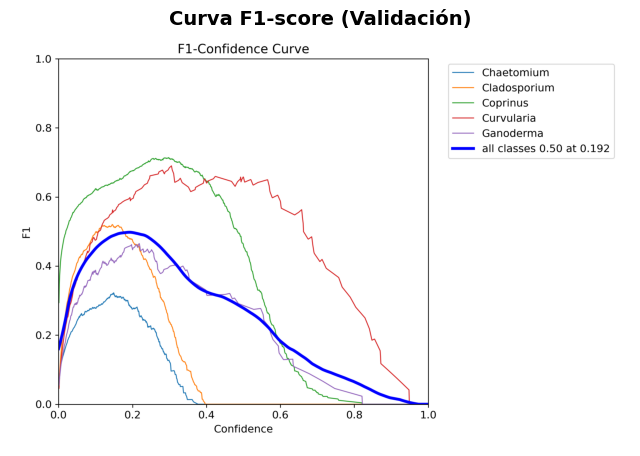

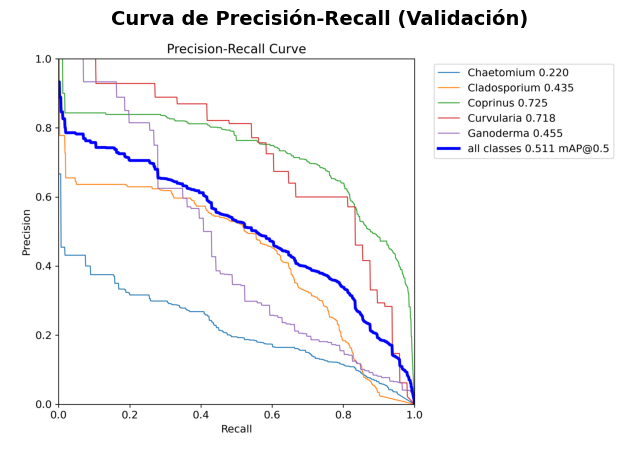

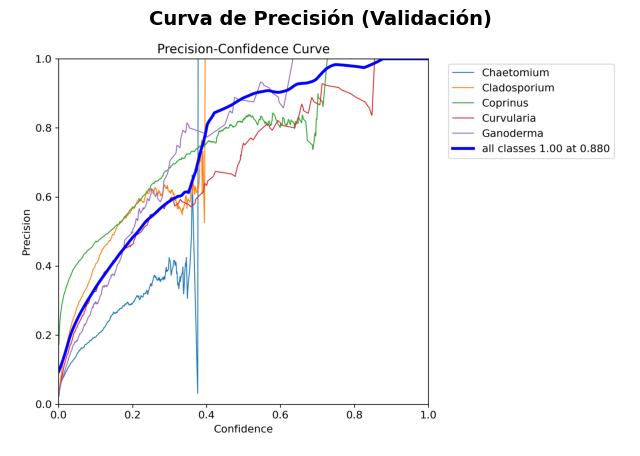

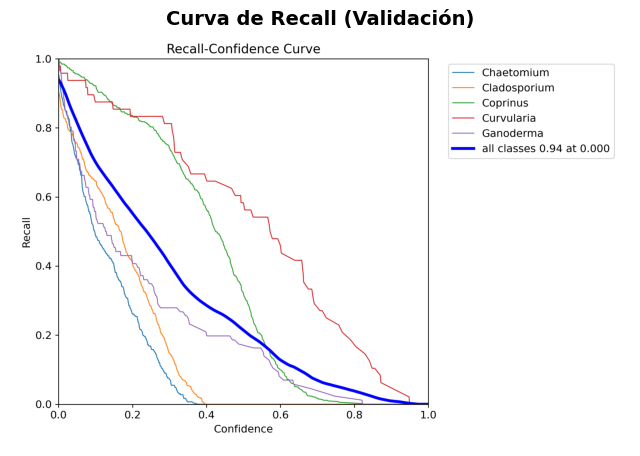

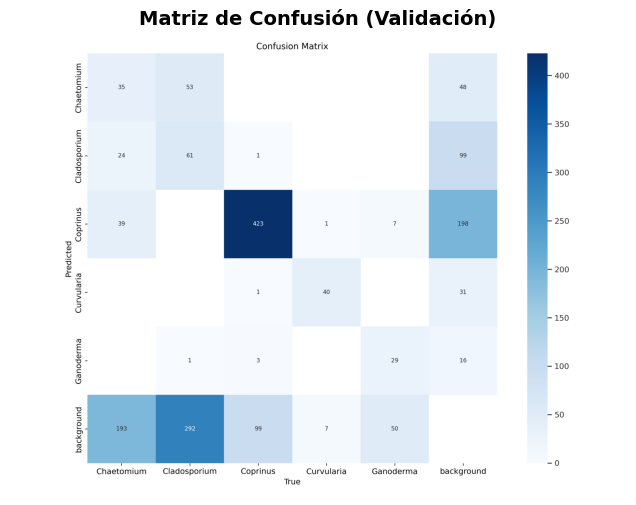

...

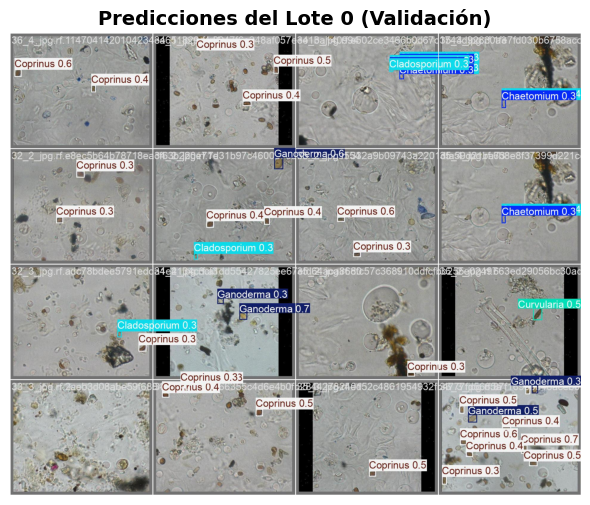

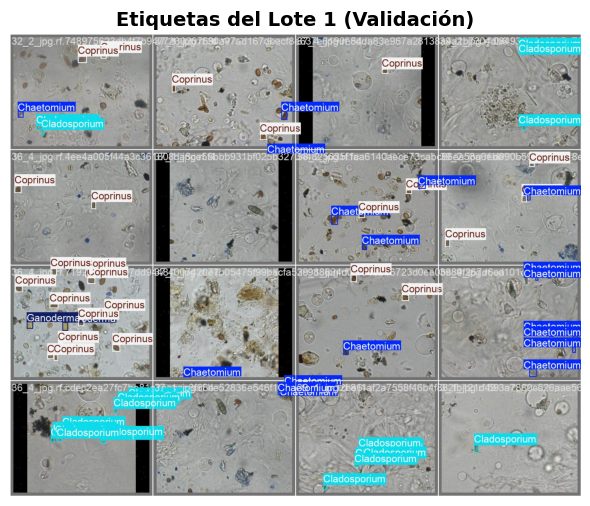

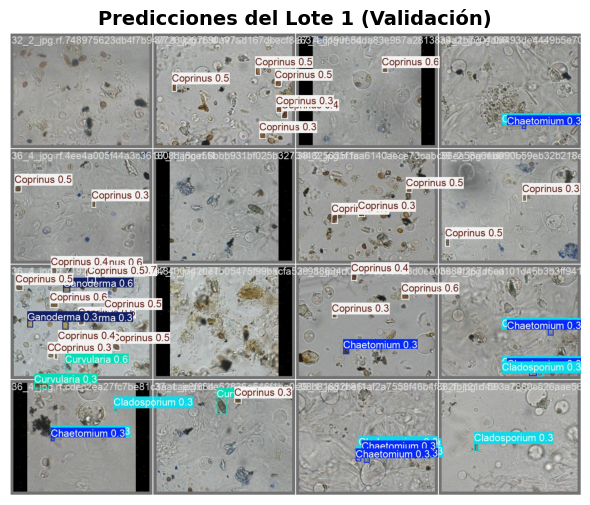

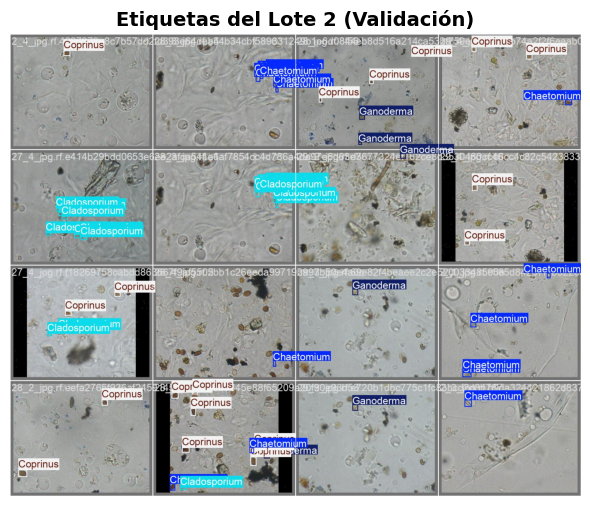

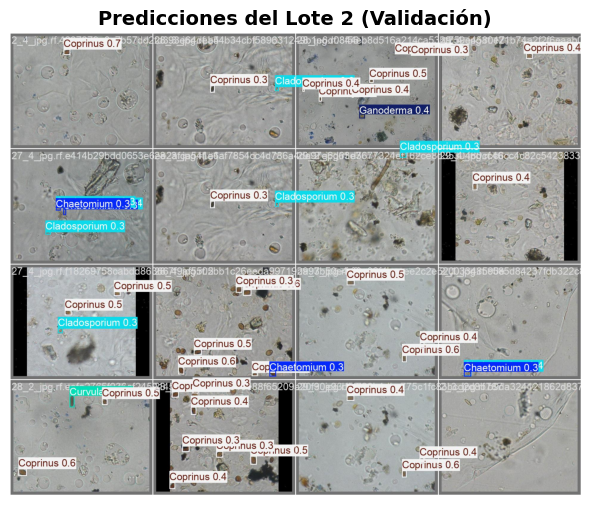

In [ ]:
import matplotlib.pyplot as plt
import cv2
import os

# Lista de rutas de imágenes con títulos explicativos
image_info = [
    ("/content/drive/MyDrive/proyectoml/runs/detect/final_model_tuned_val/F1_curve.png", "Curva F1-score (Validación)"),
    ("/content/drive/MyDrive/proyectoml/runs/detect/final_model_tuned_val/PR_curve.png", "Curva de Precisión-Recall (Validación)"),
    ("/content/drive/MyDrive/proyectoml/runs/detect/final_model_tuned_val/P_curve.png", "Curva de Precisión (Validación)"),
    ("/content/drive/MyDrive/proyectoml/runs/detect/final_model_tuned_val/R_curve.png", "Curva de Recall (Validación)"),
    ("/content/drive/MyDrive/proyectoml/runs/detect/final_model_tuned_val/confusion_matrix.png", "Matriz de Confusión (Validación)"),
    ("/content/drive/MyDrive/proyectoml/runs/detect/final_model_tuned_val/confusion_matrix_normalized.png", "Matriz de Confusión Normalizada (Validación)"),
    ("/content/drive/MyDrive/proyectoml/runs/detect/final_model_tuned_val/val_batch0_labels.jpg", "Etiquetas del Lote 0 (Validación)"),
    ("/content/drive/MyDrive/proyectoml/runs/detect/final_model_tuned_val/val_batch0_pred.jpg", "Predicciones del Lote 0 (Validación)"),
    ("/content/drive/MyDrive/proyectoml/runs/detect/final_model_tuned_val/val_batch1_labels.jpg", "Etiquetas del Lote 1 (Validación)"),
    ("/content/drive/MyDrive/proyectoml/runs/detect/final_model_tuned_val/val_batch1_pred.jpg", "Predicciones del Lote 1 (Validación)"),
    ("/content/drive/MyDrive/proyectoml/runs/detect/final_model_tuned_val/val_batch2_labels.jpg", "Etiquetas del Lote 2 (Validación)"),
    ("/content/drive/MyDrive/proyectoml/runs/detect/final_model_tuned_val/val_batch2_pred.jpg", "Predicciones del Lote 2 (Validación)")
]

# Mostrar imágenes con títulos
for img_path, title in image_info:
    if os.path.exists(img_path):  # Verificar si la imagen existe
        img = cv2.imread(img_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Convertir de BGR a RGB

        plt.figure(figsize=(8, 6))  # Tamaño de la figura
        plt.imshow(img)
        plt.axis("off")  # Ocultar ejes
        plt.title(title, fontsize=14, fontweight='bold')  # Agregar título descriptivo
        plt.show()
    else:
        print(f"⚠️ No se encontró la imagen: {img_path}")



image 1/1 /content/drive/MyDrive/proyectoml/dataset/test/images/20_3_jpg.rf.ab020ae391f7079fca2fb1d3cc25a972.jpg: 512x640 1 Coprinus, 58.9ms
Speed: 1.7ms preprocess, 58.9ms inference, 1.7ms postprocess per image at shape (1, 3, 512, 640)


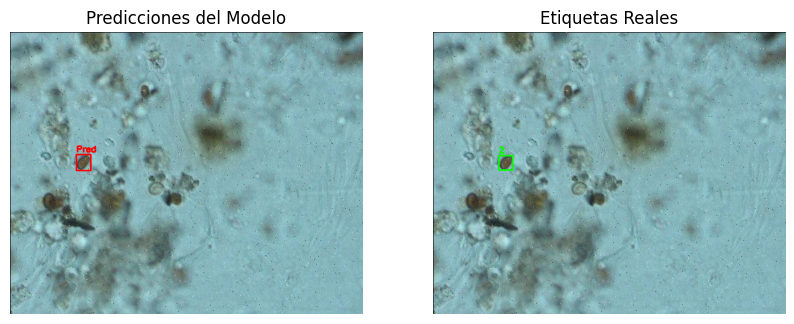


image 1/1 /content/drive/MyDrive/proyectoml/dataset/test/images/25_4_jpg.rf.dd1458d090f5f05196285f731e5d36be.jpg: 512x640 1 Cladosporium, 51.3ms
Speed: 1.7ms preprocess, 51.3ms inference, 1.4ms postprocess per image at shape (1, 3, 512, 640)


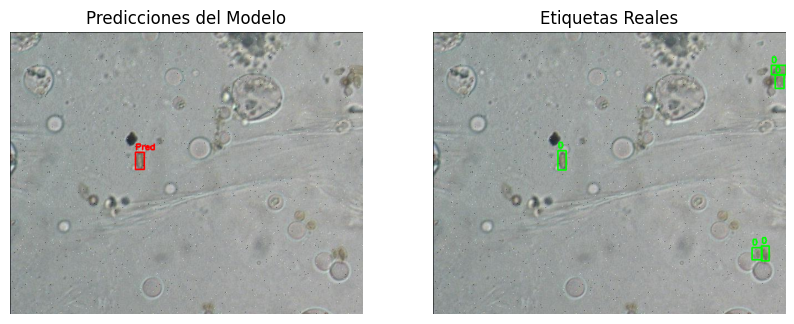


image 1/1 /content/drive/MyDrive/proyectoml/dataset/test/images/26_1_jpg.rf.95c2786fecff624738c258a59040e53f.jpg: 512x640 1 Coprinus, 70.6ms
Speed: 1.7ms preprocess, 70.6ms inference, 1.5ms postprocess per image at shape (1, 3, 512, 640)


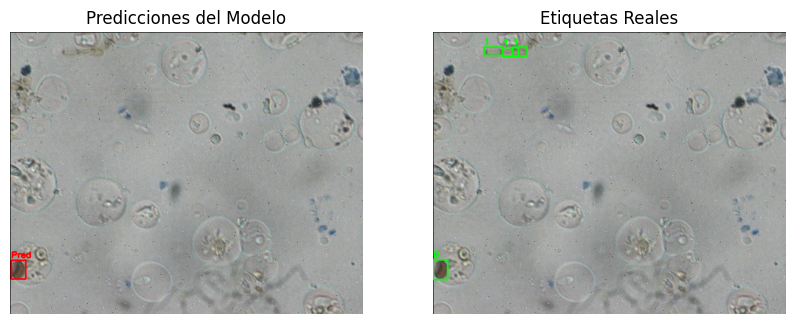


image 1/1 /content/drive/MyDrive/proyectoml/dataset/test/images/49_4_jpg.rf.43caf59b78ad2427f4c5f51bac4a7736.jpg: 512x640 4 Coprinuss, 70.7ms
Speed: 2.7ms preprocess, 70.7ms inference, 1.7ms postprocess per image at shape (1, 3, 512, 640)


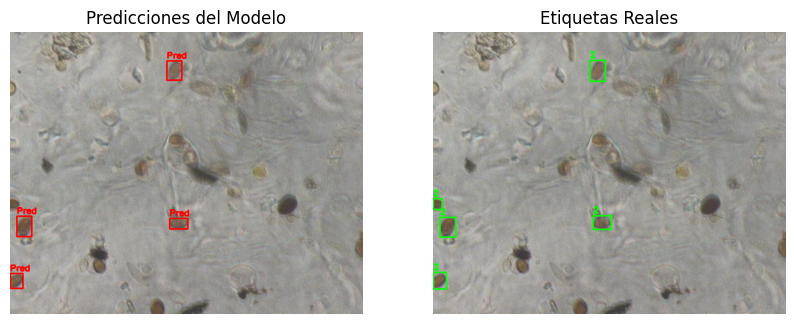


image 1/1 /content/drive/MyDrive/proyectoml/dataset/test/images/23_4_jpg.rf.380e527042056c7ad6d014bd2ddc0a1c.jpg: 512x640 1 Coprinus, 1 Curvularia, 70.6ms
Speed: 1.7ms preprocess, 70.6ms inference, 1.7ms postprocess per image at shape (1, 3, 512, 640)


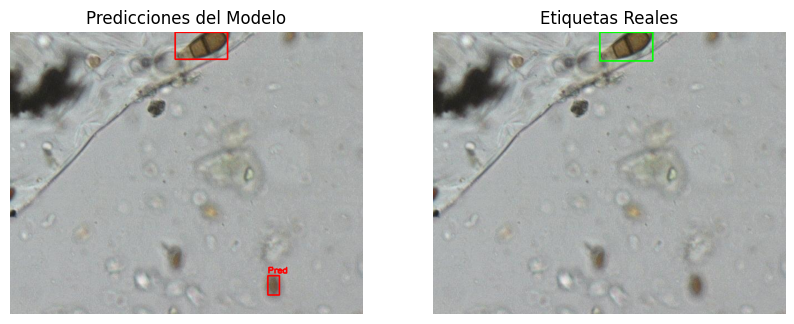


image 1/1 /content/drive/MyDrive/proyectoml/dataset/test/images/39_3_jpg.rf.db01a46b1c3acc47eb370511d9dbe39c.jpg: 512x640 3 Coprinuss, 70.7ms
Speed: 2.4ms preprocess, 70.7ms inference, 1.6ms postprocess per image at shape (1, 3, 512, 640)


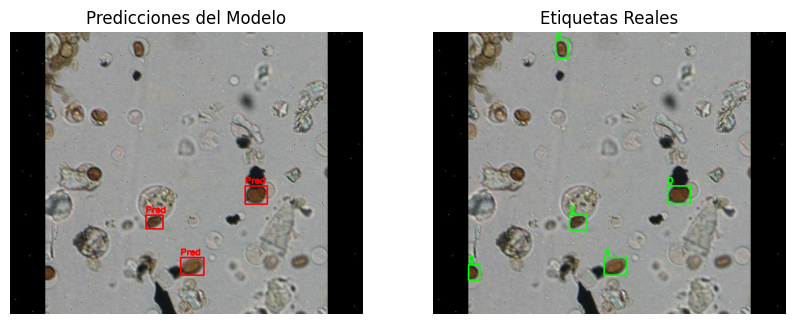


image 1/1 /content/drive/MyDrive/proyectoml/dataset/test/images/58_3_jpg.rf.ecc46a2c9999320f3ba47078ba4a8dc6.jpg: 512x640 (no detections), 70.6ms
Speed: 2.4ms preprocess, 70.6ms inference, 0.7ms postprocess per image at shape (1, 3, 512, 640)


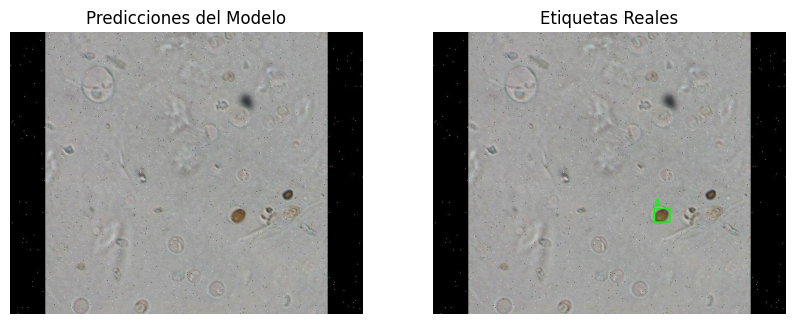


image 1/1 /content/drive/MyDrive/proyectoml/dataset/test/images/2_06_04-1-_jpg.rf.0e5f67853492d7d80086dfea0f185243.jpg: 640x640 12 Coprinuss, 94.3ms
Speed: 2.0ms preprocess, 94.3ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


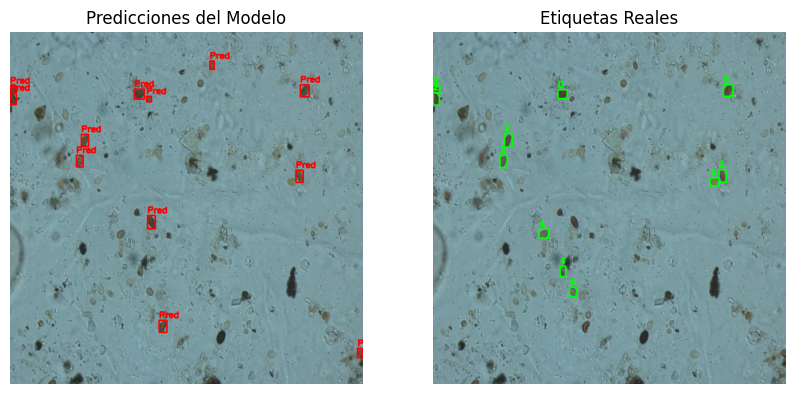


image 1/1 /content/drive/MyDrive/proyectoml/dataset/test/images/1_06_12-9-_jpg.rf.9757a1951da4f046e89fb81cb8502f77.jpg: 640x640 1 Coprinus, 1 Curvularia, 87.4ms
Speed: 2.0ms preprocess, 87.4ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


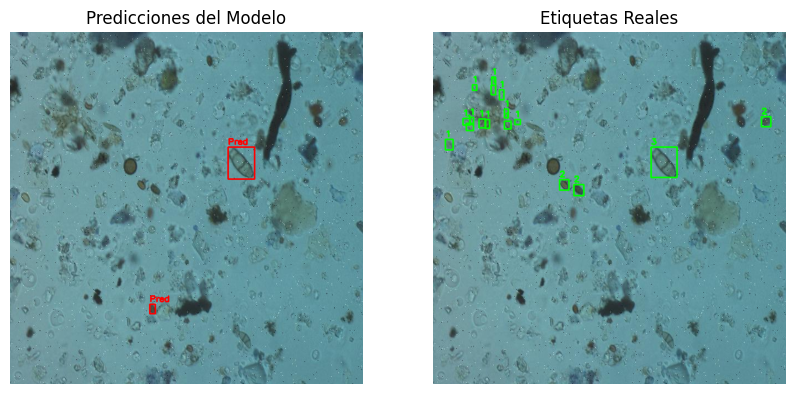


image 1/1 /content/drive/MyDrive/proyectoml/dataset/test/images/39_3_jpg.rf.16c20448fc5f34c30df6de6449f00914.jpg: 512x640 8 Cladosporiums, 1 Coprinus, 1 Ganoderma, 62.4ms
Speed: 2.7ms preprocess, 62.4ms inference, 1.4ms postprocess per image at shape (1, 3, 512, 640)


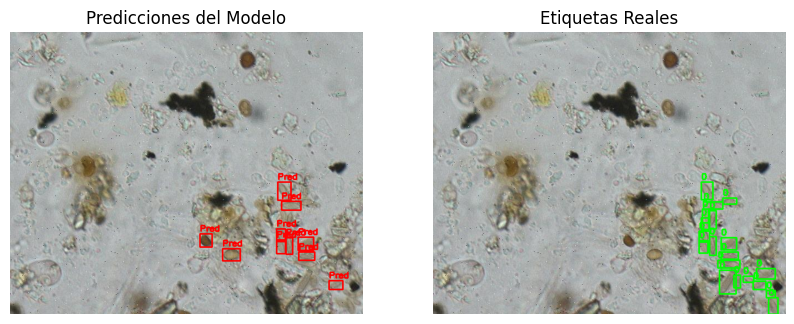


image 1/1 /content/drive/MyDrive/proyectoml/dataset/test/images/30_2_jpg.rf.6a08975c432d976bf4910a3547e54465.jpg: 512x640 (no detections), 61.3ms
Speed: 1.7ms preprocess, 61.3ms inference, 0.7ms postprocess per image at shape (1, 3, 512, 640)


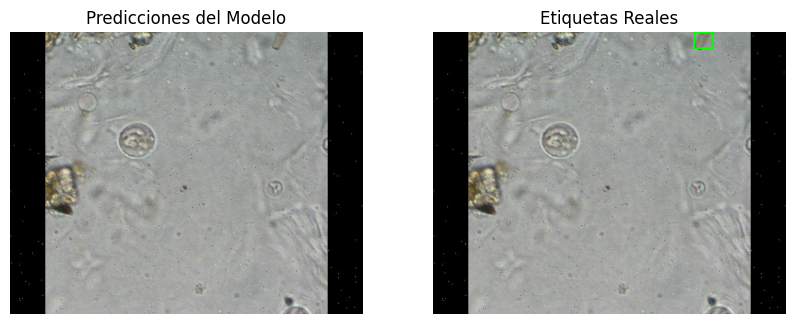


image 1/1 /content/drive/MyDrive/proyectoml/dataset/test/images/22_2_jpg.rf.669e0a30de32dad6b9a72b0d3b6d8ed6.jpg: 512x640 3 Coprinuss, 70.6ms
Speed: 1.7ms preprocess, 70.6ms inference, 1.5ms postprocess per image at shape (1, 3, 512, 640)


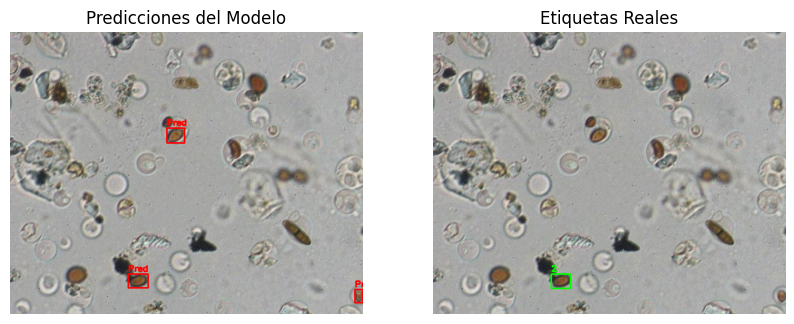


image 1/1 /content/drive/MyDrive/proyectoml/dataset/test/images/1_1_jpg.rf.7fd8a4609ee6c7ea6731cc6c6e0d86dc.jpg: 512x640 1 Coprinus, 70.6ms
Speed: 1.9ms preprocess, 70.6ms inference, 1.5ms postprocess per image at shape (1, 3, 512, 640)


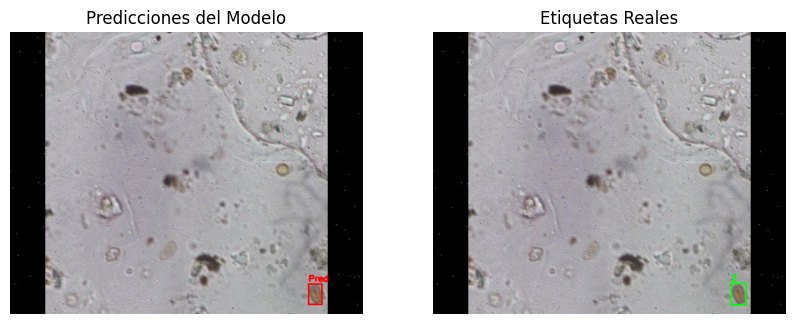


image 1/1 /content/drive/MyDrive/proyectoml/dataset/test/images/21_2_jpg.rf.4cc6e0e411dd7e035471b4f14c068773.jpg: 512x640 1 Cladosporium, 70.6ms
Speed: 2.4ms preprocess, 70.6ms inference, 1.5ms postprocess per image at shape (1, 3, 512, 640)


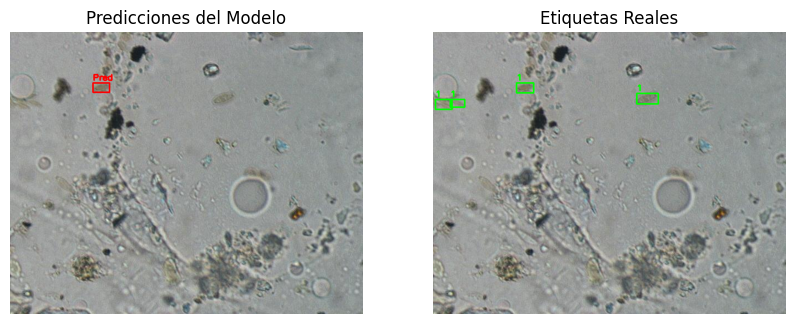


image 1/1 /content/drive/MyDrive/proyectoml/dataset/test/images/1_06_22-6-_jpg.rf.292f3538f60f2a84a29a3e99b9089e31.jpg: 640x640 1 Coprinus, 1 Curvularia, 94.1ms
Speed: 2.9ms preprocess, 94.1ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


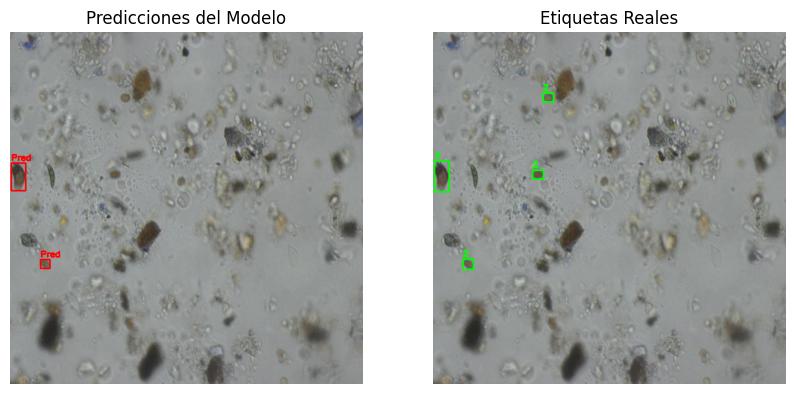


image 1/1 /content/drive/MyDrive/proyectoml/dataset/test/images/1_06_22-13-_jpg.rf.eb69f37513cd867cbf1996fff6689703.jpg: 640x640 3 Coprinuss, 91.2ms
Speed: 1.9ms preprocess, 91.2ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)


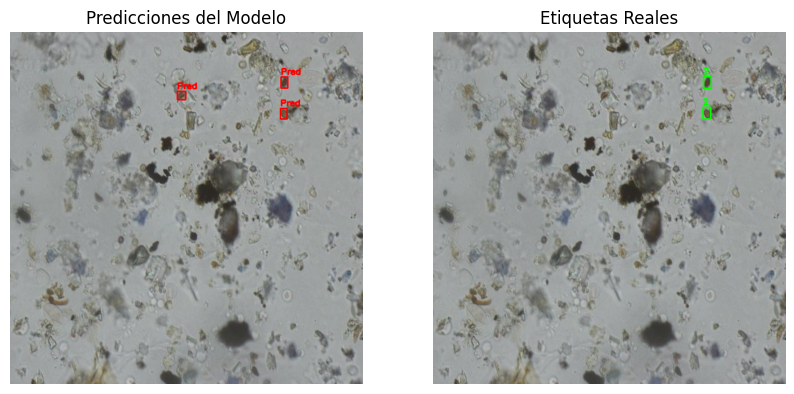


image 1/1 /content/drive/MyDrive/proyectoml/dataset/test/images/39_3_jpg.rf.91c8de649ffaa40f9625f81e8404eda2.jpg: 512x640 1 Chaetomium, 2 Coprinuss, 62.5ms
Speed: 1.8ms preprocess, 62.5ms inference, 1.8ms postprocess per image at shape (1, 3, 512, 640)


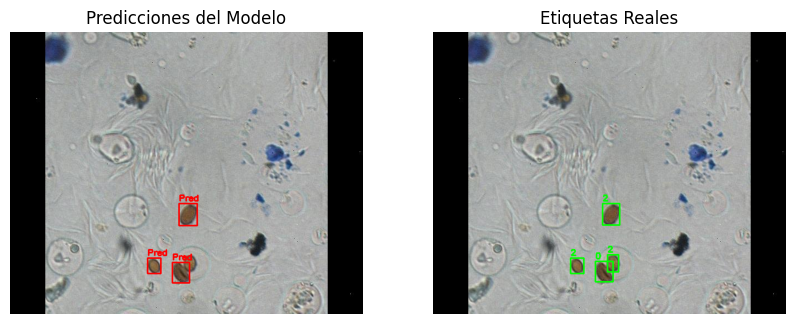


image 1/1 /content/drive/MyDrive/proyectoml/dataset/test/images/25_2_jpg.rf.20082c0e7f739d0e42f38f05b5441a2d.jpg: 512x640 4 Coprinuss, 61.3ms
Speed: 2.4ms preprocess, 61.3ms inference, 1.5ms postprocess per image at shape (1, 3, 512, 640)


In [ ]:
import os
import glob
import cv2
import numpy as np
import matplotlib.pyplot as plt
from ultralytics import YOLO

# Cargar el modelo YOLO
model = YOLO("/content/drive/MyDrive/proyectoml/runs/detect/final_model_tuned/weights/best.pt")

# Definir las rutas de imágenes y etiquetas
image_folder = "/content/drive/MyDrive/proyectoml/dataset/test/images"
label_folder = "/content/drive/MyDrive/proyectoml/dataset/test/labels"

# Obtener lista de imágenes
image_paths = glob.glob(os.path.join(image_folder, "*.jpg"))  # Cambia la extensión si es diferente

# Función para dibujar los bounding boxes en una imagen
def draw_bounding_boxes(image, boxes, labels, color=(0, 255, 0), thickness=2):
    for box, label in zip(boxes, labels):
        x_min, y_min, x_max, y_max = box
        x_min, y_min, x_max, y_max = int(x_min), int(y_min), int(x_max), int(y_max)

        # Dibujar la caja
        cv2.rectangle(image, (x_min, y_min), (x_max, y_max), color, thickness)

        # Colocar la etiqueta
        cv2.putText(image, label, (x_min, y_min - 5), cv2.FONT_HERSHEY_SIMPLEX, 0.5, color, thickness)

    return image

# Función para cargar etiquetas YOLO de un archivo .txt
def load_yolo_labels(label_path, img_w, img_h):
    boxes = []
    labels = []
    if os.path.exists(label_path):
        with open(label_path, "r") as f:
            lines = f.readlines()
            for line in lines:
                values = line.strip().split()
                class_id = int(values[0])  # Clase (número)
                x_center, y_center, width, height = map(float, values[1:])

                # Convertir de formato YOLO (relativo) a coordenadas absolutas
                x_min = (x_center - width / 2) * img_w
                y_min = (y_center - height / 2) * img_h
                x_max = (x_center + width / 2) * img_w
                y_max = (y_center + height / 2) * img_h

                boxes.append([x_min, y_min, x_max, y_max])
                labels.append(str(class_id))  # Puedes cambiar esto por nombres de clases si tienes un diccionario

    return boxes, labels

# Procesar cada imagen
for img_path in image_paths:
    # Cargar imagen original
    img_name = os.path.basename(img_path)
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # Obtener tamaño de la imagen
    img_h, img_w, _ = img.shape

    # Obtener la inferencia del modelo
    results = model(img_path)

    # Procesar los resultados del modelo
    pred_img = img.copy()
    for result in results:
        if result.boxes is not None:
            pred_boxes = result.boxes.xyxy.cpu().numpy()  # Coordenadas absolutas (x_min, y_min, x_max, y_max)
            pred_labels = ["Pred"] * len(pred_boxes)  # Placeholder, puedes usar nombres de clases si los tienes
            pred_img = draw_bounding_boxes(pred_img, pred_boxes, pred_labels, color=(255, 0, 0))  # Azul

    # Cargar etiquetas reales desde la carpeta de labels
    label_path = os.path.join(label_folder, img_name.replace(".jpg", ".txt"))
    gt_img = img.copy()
    gt_boxes, gt_labels = load_yolo_labels(label_path, img_w, img_h)
    gt_img = draw_bounding_boxes(gt_img, gt_boxes, gt_labels, color=(0, 255, 0))  # Verde

    # Mostrar ambas imágenes juntas
    fig, axes = plt.subplots(1, 2, figsize=(10, 5))
    axes[0].imshow(pred_img)
    axes[0].set_title("Predicciones del Modelo")
    axes[0].axis("off")

    axes[1].imshow(gt_img)
    axes[1].set_title("Etiquetas Reales")
    axes[1].axis("off")

    plt.show()
